# Mississippi River Heights Exploration:
## Working with In Situ Measurements and Satellite Hydrology Data in the Cloud

### Learning Objectives
 - Access data from the cloud (Pre-SWOT MEaSUREs river heights) and utilize in tandem with locally hosted dataset (USGS gauges)
 - Search for products using Earthdata Search GUI
 - Access datasets using xarray and visualize

This tutorial explores the relationships between satellite and in situ river heights in the Mississippi River using the data sets listed below. The notebook is designed to be executed in Amazon Web Services (AWS) (in *us-west-2* region where the cloud data is located).

## Datasets
The tutorial itself will use two different datasets: 

1\. **PRESWOT_HYDRO_GRRATS_L2_DAILY_VIRTUAL_STATION_HEIGHTS_V2** 

>DOI: [https://doi.org/10.5067/PSGRA-DA2V2](https://doi.org/10.5067/PSGRA-DA2V2)
   
    The NASA Pre-SWOT Making Earth System Data Records for Use in Research Environments (MEaSUREs) Program virtual river height gauges from various altimeter satellites. 

   
2\. **USGS Water Data for the Nations River Gauges**
   
>URL: [https://dashboard.waterdata.usgs.gov/app/nwd/?region=lower48&aoi=default](https://dashboard.waterdata.usgs.gov/app/nwd/?region=lower48&aoi=default)
    
    River heights are obtained from the United States Geologic Survey (USGS) National Water Dashboard.


## Needed Packages

In [1]:
import os
import glob
import s3fs
import requests
import numpy as np
import pandas as pd
import xarray as xr
import hvplot.xarray
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import csv
from datetime import datetime
from os.path import isfile, basename, abspath

## Get Temporary AWS Credentials for Access

S3 is an 'object store' hosted in AWS for cloud processing. Direct S3 access is achieved by passing NASA supplied temporary credentials to AWS so we can interact with S3 objects from applicable Earthdata Cloud buckets. Note, these temporary credentials are valid for only 1 hour. A netrc file is required to aquire these credentials. Use the [NASA Earthdata Authentication](https://github.com/NASA-Openscapes/2021-Cloud-Hackathon/blob/main/tutorials/04_NASA_Earthdata_Authentication.ipynb) to create a netrc file in your home directory. (Note: A NASA Earthdata Login is required to access data from the NASA Earthdata system. Please visit https://urs.earthdata.nasa.gov to register and manage your Earthdata Login account. This account is free to create and only takes a moment to set up.) 

The following crediential is for PODAAC, but other credentials are needed to access data from other NASA DAACs.

In [2]:
s3_cred_endpoint = 'https://archive.podaac.earthdata.nasa.gov/s3credentials'

Create a function to make a request to an endpoint for temporary credentials.

In [3]:
def get_temp_creds():
    temp_creds_url = s3_cred_endpoint
    return requests.get(temp_creds_url).json()

In [4]:
temp_creds_req = get_temp_creds()
#temp_creds_req                      # !!! BEWARE, removing the # on this line will print your temporary S3 credentials.

#### Set up an `s3fs` session for Direct Access
`s3fs` sessions are used for authenticated access to s3 bucket and allows for typical file-system style operations. Below we create session by passing in the temporary credentials we recieved from our temporary credentials endpoint.

In [5]:
fs_s3 = s3fs.S3FileSystem(anon=False, 
                          key=temp_creds_req['accessKeyId'], 
                          secret=temp_creds_req['secretAccessKey'], 
                          token=temp_creds_req['sessionToken'],
                          client_kwargs={'region_name':'us-west-2'})

## Pre-SWOT MEaSUREs River Heights
The shortname for MEaSUREs is 'PRESWOT_HYDRO_GRRATS_L2_DAILY_VIRTUAL_STATION_HEIGHTS_V2' with the concept ID: C2036882359-POCLOUD. The [guidebook](https://podaac-tools.jpl.nasa.gov/drive/files/allData/preswot_hydrology/L2/rivers/docs/GRRATS_user_handbookV2.pdf) explains the details of the Pre-SWOT MEaSUREs data.

Our desired MEaSUREs variable is river height (meters above EGM2008 geoid) for this exercise, which can be subset by distance and time. Distance represents the distance from the river mouth, in this example, the Mississippi River. Time is between April 8, 1993 and April 20, 2019.

For this dataset, we found the cloud-enabled data directly using the Earthdata Search [(see the Earthdata Search for downloading data tutorial)](https://github.com/podaac/tutorials/blob/master/notebooks/batch_download_podaac_data.md) by searching directly for the concept ID, and locating the granule needed, G2105959746-POCLOUD, that will show us the Mississippi river. 

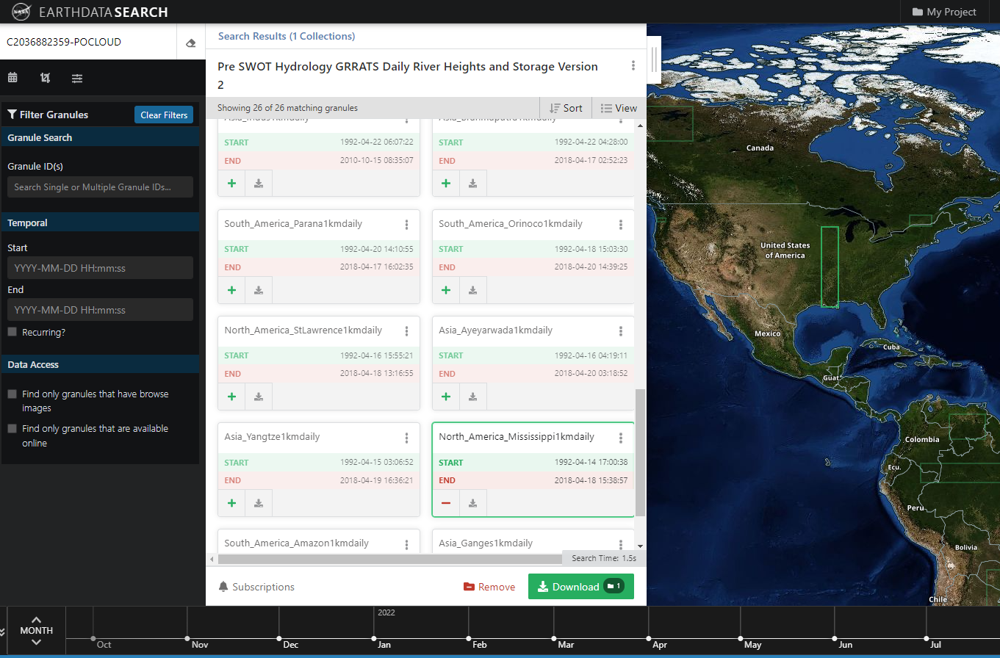

The s3 link for this granule can be found in it's meta data by viewing the details of the granule from the button with three vertical dots in the corner. The s3 link is under 'relatedURLs', or it can be found by going through the download process and instead of downloading, clicking the tab entitled "AWS S3 Access."

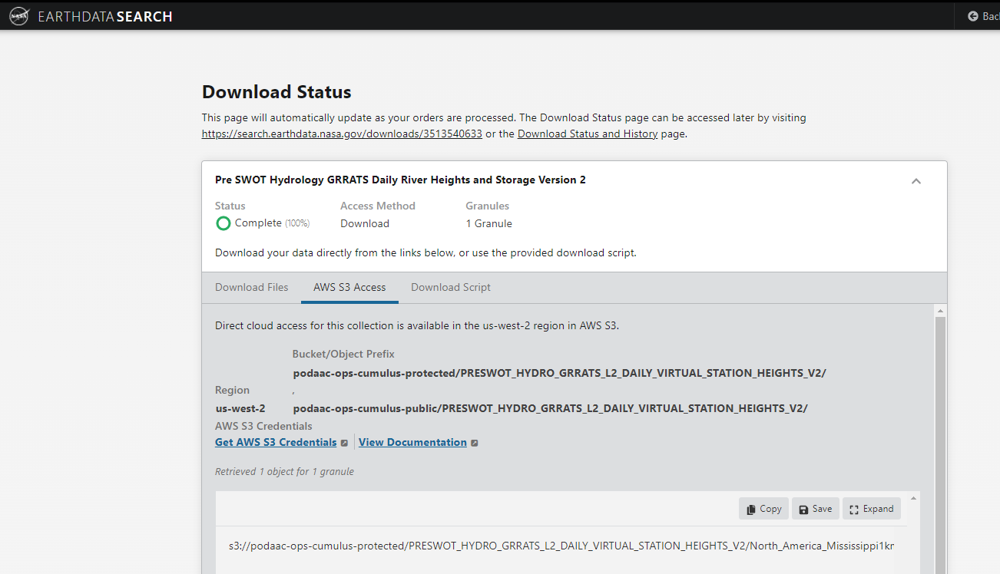

Let's access the netCDF file from an s3 bucket and look at the data structure.

In [6]:
s3_MEaSUREs_url = 's3://podaac-ops-cumulus-protected/PRESWOT_HYDRO_GRRATS_L2_DAILY_VIRTUAL_STATION_HEIGHTS_V2/North_America_Mississippi1kmdaily.nc'

In [7]:
s3_file_obj = fs_s3.open(s3_MEaSUREs_url, mode='rb')

In [8]:
ds_MEaSUREs = xr.open_dataset(s3_file_obj, engine='h5netcdf')
ds_MEaSUREs

<xarray.Dataset>
Dimensions:              (X: 2766, Y: 2766, distance: 2766, time: 9440,
                          charlength: 26)
Coordinates:
  * time                 (time) datetime64[ns] 1993-04-14T17:00:38.973026816 ...
Dimensions without coordinates: X, Y, distance, charlength
Data variables:
    lon                  (X) float64 ...
    lat                  (Y) float64 ...
    FD                   (distance) float64 ...
    height               (distance, time) float64 ...
    sat                  (charlength, time) |S1 ...
    storage              (distance, time) float64 ...
    IceFlag              (time) float64 ...
    LakeFlag             (distance) float64 ...
    Storage_uncertainty  (distance, time) float64 ...
Attributes: (12/40)
    title:                         GRRATS (Global River Radar Altimetry Time ...
    Conventions:                   CF-1.6, ACDD-1.3
    institution:                   Ohio State University, School of Earth Sci...
    source:                        MEaSUREs OSU Storage toolbox 2018
    keywords:                      EARTH SCIENCE,TERRESTRIAL HYDROSPHERE,SURF...
    keywords_vocabulary:           Global Change Master Directory (GCMD)
    ...                            ...
    geospatial_lat_max:            44.56663081735837
    geospatial_lat_units:          degree_north
    geospatial_vertical_max:       201.5947042200621
    geospatial_vertical_min:       -2.2912740783007286
    geospatial_vertical_units:     m
    geospatial_vertical_positive:  up

#### Plot a subset of the data
Plotting the river distances and associated heights on the map at time t=9069 (March 16, 2018) using `plt`.

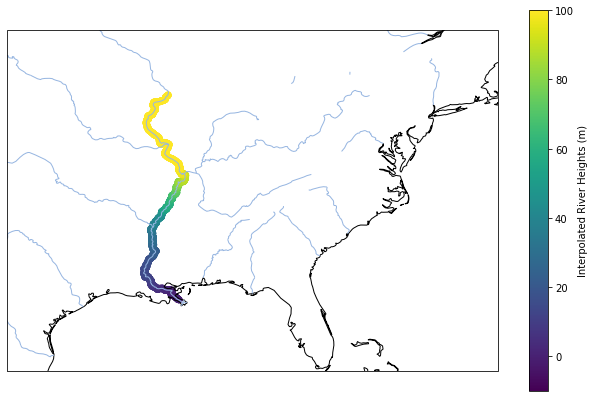

In [9]:
fig = plt.figure(figsize=[11,7]) 
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_extent([-100, -70, 25, 45])
ax.add_feature(cartopy.feature.RIVERS)

plt.scatter(ds_MEaSUREs.lon, ds_MEaSUREs.lat, lw=1, c=ds_MEaSUREs.height[:,9069])
plt.colorbar(label='Interpolated River Heights (m)')
plt.clim(-10,100)

plt.show()

## USGS Gauge River Heights


In situ measurements on the Mississippi River can be obtained from the United States Geologic Survey (USGS) [National Water Dashboard](https://dashboard.waterdata.usgs.gov/app/nwd/?region=lower48&aoi=default).

Here, we zoom into one of the streamgauges toward the outlet of the Mississippi River, Monitoring location 07374525: Mississippi River at Belle Chasse, LA highlighted in green.
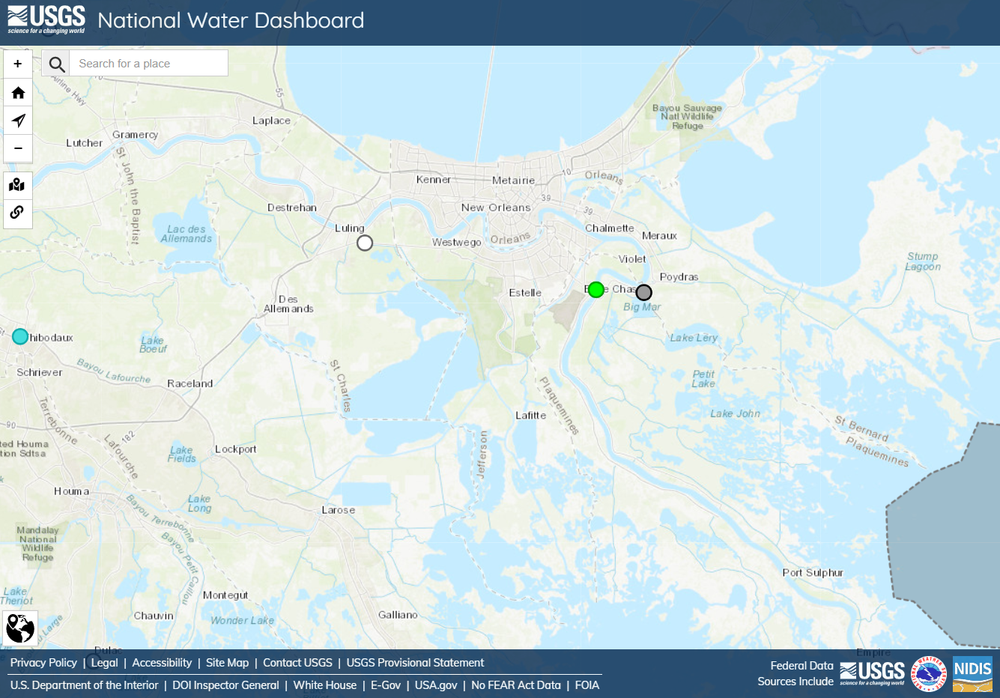

If the point is selected, data can be obtained for the particular location. This gauge is located at lon, lat: (-89.977847, 29.85715084) and we can obtain gauge height for the time period October 2008 - 2021. 

Once the text file is downloaded for the gauge heights, and the headers removed, it can be uploaded to the cloud as a dataframe to work alongside the MEaSUREs data. Click the `upload files` button in the top left corner to do so.


In [10]:
df_gauge_data = pd.read_csv('Mississippi_outlet_gauge.txt', delimiter = "\t")
#clean data and convert units to meters
df_gauge_data.columns = ["agency", "site_no", "datetime", "river_height", "qual_code"]
df_gauge_data['datetime'] = pd.to_datetime(df_gauge_data['datetime']) 
df_gauge_data['river_height'] = df_gauge_data['river_height']*0.3048
df_gauge_data

,agency,site_no,datetime,river_height,qual_code
0,USGS,7374525,2008-10-29,2.322576,A
1,USGS,7374525,2008-10-30,2.337816,A
2,USGS,7374525,2008-10-31,2.368296,A
3,USGS,7374525,2008-11-01,2.356104,A
4,USGS,7374525,2008-11-02,2.459736,A
...,...,...,...,...,...
4807,USGS,7374525,2021-12-27,2.819400,A
4808,USGS,7374525,2021-12-28,2.901696,A
4809,USGS,7374525,2021-12-29,2.919984,A
4810,USGS,7374525,2021-12-30,2.874264,A


#### Plot the data

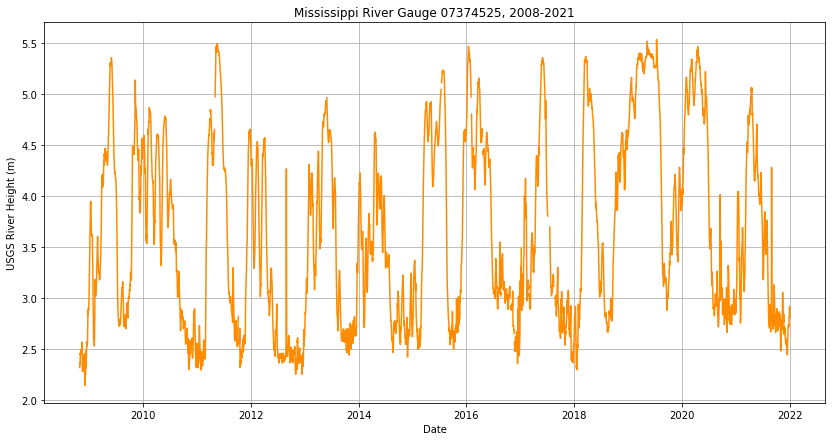

In [11]:
fig = plt.figure(figsize=[14,7]) 
plt.plot(df_gauge_data.datetime, df_gauge_data.river_height, color = 'darkorange')

plt.xlabel('Date')
plt.ylabel('USGS River Height (m)')

plt.title('Mississippi River Gauge 07374525, 2008-2021')
plt.grid()
plt.show()

#### Find the same location in the MEaSUREs Dataset using lat/lon

The closest location in the MEaSUREs dataset to the gauge (-89.977847, 29.85715084) is at index 106 where lon, lat is (-89.976628, 29.855369). We'll use this for comparison.

In [12]:
ds_MEaSUREs.lat[106]

<xarray.DataArray 'lat' ()>
array(29.855369)
Attributes:
    units:          degrees_north
    long_name:      latitude
    standard_name:  latitude
    axis:           Y

In [13]:
ds_MEaSUREs.lon[106]

<xarray.DataArray 'lon' ()>
array(-89.976628)
Attributes:
    units:          degrees_east
    long_name:      longitude
    standard_name:  longitude
    axis:           X

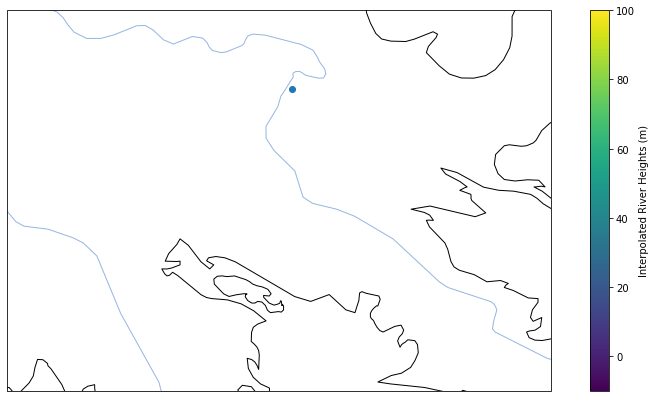

In [14]:
fig = plt.figure(figsize=[14,7]) 
ax = plt.axes(projection=ccrs.PlateCarree())
ax.coastlines()
ax.set_extent([-90.5, -89.5, 29.3, 30])
ax.add_feature(cartopy.feature.RIVERS)

plt.scatter(ds_MEaSUREs.lon[106], ds_MEaSUREs.lat[106], lw=1)
plt.colorbar(label='Interpolated River Heights (m)')
plt.clim(-10,100)

plt.show()

### Combined timeseries plot of river heights from each source

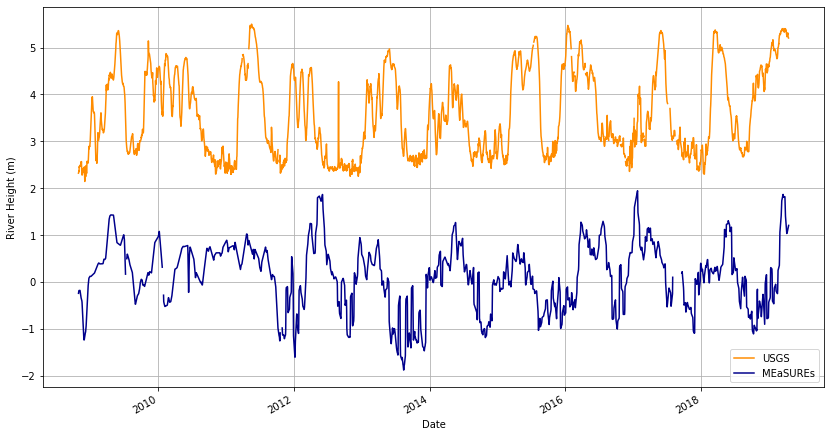

In [15]:
fig = plt.figure(figsize=[14,7]) 
plt.plot(df_gauge_data.datetime[0:3823], df_gauge_data.river_height[0:3823], color = 'darkorange')
ds_MEaSUREs.height[106,5657:9439].plot(color='darkblue')

plt.xlabel('Date')
plt.ylabel('River Height (m)')
plt.legend(['USGS', 'MEaSUREs'], loc='lower right')

plt.grid()
plt.show()

### Looks like the datums need fixing!

The USGS gauge datum is 6.58 feet below NAVD88 GEOID12B EPOCH 2010, while the MEaSUREs datum is height above the WGS84 Earth Gravitational Model (EGM 08) geoid, causing this discrepancy. 

## Use Case: Validation

To validate the MEaSUREs dataset, the authors of the dataset actually compare relative heights between gauges, as opposed to absolute heights, in order to avoid the influence of datum errors and the lack of correspondence between satellite ground tracks and gauge locations. They calculate relative heights by removing the long-term mean of difference between the sample pairs of virtual station heights and the stage measured by the stream gauges. We'll repeat this method below for completeness and calculate the Nash-Sutcliffe Efficiency (NSE) value. 

In [16]:
#create dataframes of the two dataset river heights so values can be subtracted easier (the datasets have different numbers of observations)
g_height_df = pd.DataFrame()
m_height_df = pd.DataFrame()
g_height_df['time'] = df_gauge_data.datetime[0:3823].dt.date
g_height_df['gauge_height'] = df_gauge_data.river_height[0:3823]
m_height_df['time'] = ds_MEaSUREs.time[5657:9439].dt.date
m_height_df['MEaSUREs_height'] = ds_MEaSUREs.height[106,5657:9439]
#merge into one by time
height_df = pd.merge(g_height_df, m_height_df, on='time', how='left')
height_df

,time,gauge_height,MEaSUREs_height
0,2008-10-29,2.322576,-0.238960
1,2008-10-30,2.337816,-0.209417
2,2008-10-31,2.368296,-0.180987
3,2008-11-01,2.356104,-0.178015
4,2008-11-02,2.459736,-0.177945
...,...,...,...
3819,2019-04-13,5.312664,1.132784
3820,2019-04-14,5.236464,1.152391
3821,2019-04-15,5.230368,1.172064
3822,2019-04-16,5.221224,1.192314


In [17]:
diff = height_df.gauge_height - height_df.MEaSUREs_height
mean_diff = diff.mean()
mean_diff

3.451153237576882

In [18]:
height_df['relative_gauge_height'] = height_df.gauge_height - mean_diff

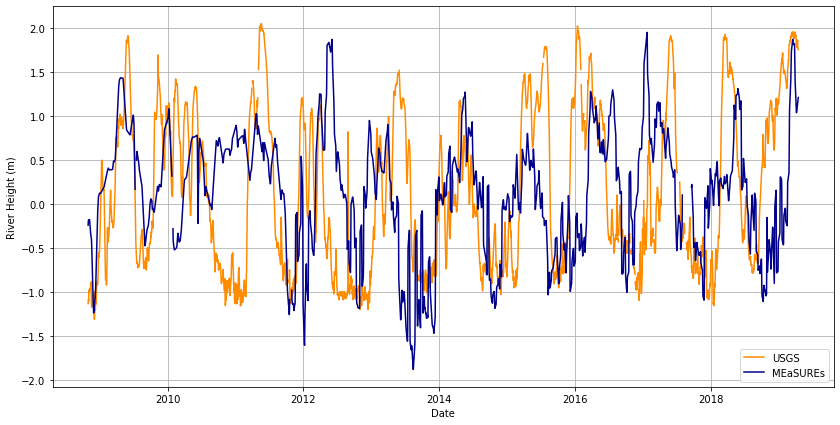

In [19]:
fig = plt.figure(figsize=[14,7]) 
plt.plot(height_df.time, height_df.relative_gauge_height, color = 'darkorange')
plt.plot(height_df.time, height_df.MEaSUREs_height, color = 'darkblue')

plt.xlabel('Date')
plt.ylabel('River Height (m)')
plt.legend(['USGS', 'MEaSUREs'], loc='lower right')

plt.grid()
plt.show()

#### Nash Sutcliffe Efficiency

In [20]:
NSE = 1-(np.sum((height_df.MEaSUREs_height-height_df.relative_gauge_height)**2)/np.sum((height_df.relative_gauge_height-np.mean(height_df.relative_gauge_height))**2))
NSE

-0.2062487355865772

NSE for Oct 2013 - Sept 2014 water year:

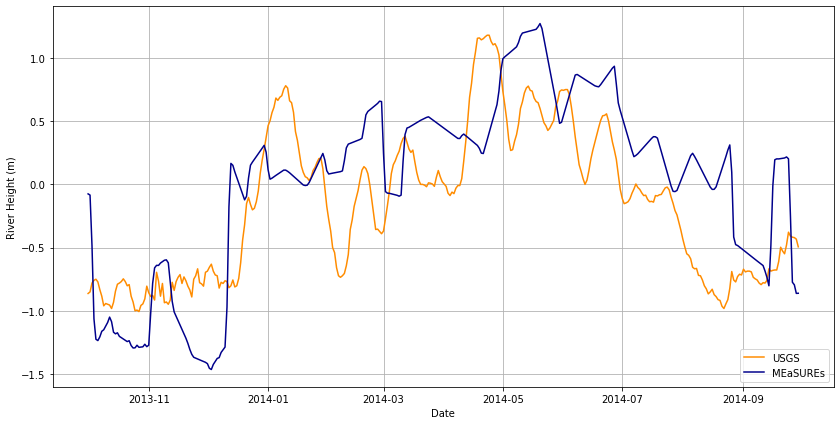

In [21]:
fig = plt.figure(figsize=[14,7]) 
plt.plot(height_df.time[1799:2163], height_df.relative_gauge_height[1799:2163], color = 'darkorange')
plt.plot(height_df.time[1799:2163], height_df.MEaSUREs_height[1799:2163], color = 'darkblue')

plt.xlabel('Date')
plt.ylabel('River Height (m)')
plt.legend(['USGS', 'MEaSUREs'], loc='lower right')

plt.grid()
plt.show()

In [22]:
NSE_2014 = 1-(np.sum((height_df.MEaSUREs_height[1799:2163]-height_df.relative_gauge_height[1799:2163])**2)/np.sum((height_df.relative_gauge_height[1799:2163]-np.mean(height_df.relative_gauge_height[1799:2163]))**2))
NSE_2014

0.18294061649986848

### Possible Explanations for discrepancies

 - Multiple satellites, different return periods
 - Data interpolation
 - Satellite tracks instead of swaths like SWOT will have, spatial interpolation
 - Radar altimeter performance varies, was not designed to measure rivers

MEaSUREs is comprised of the Global River Radar Altimeter Time Series (GRRATS) 1km/daily interpolation river heights from ERS1, ERS2, TOPEX/Poseidon, OSTM/Jason-2, Envisat, and Jason-3 that are interpolated and processed to create continuous heights for the study over the temporal range of the altimeters used. Each satellite has differing return periods (ie. Jason has a 10-day revist, Envisat 35 days) so to fill the data gaps, perhaps much needed to be interpolated and caused misalignment. In addition, the satellite tracks of these altimeter satellites do not capture entire river reaches with wide swath tracks like the Surface Water and Ocean Topography (SWOT) mission will do in the future. Thus locations observed among satellites may be different and data interpolated spatially, increasing errors. Also, radar altimeter performance varies dramatically across rivers and across Virtual Stations, as the creators of the dataset mention in the [guidebook](https://podaac-tools.jpl.nasa.gov/drive/files/allData/preswot_hydrology/L2/rivers/docs/GRRATS_user_handbookV2.pdf).

In addition, the authors note that the Mississippi NSE values ranged from -0.22 to 0.96
with an average of 0.43 when evaluating the dataset, so it looks like we unintentionally honed into one of the stations with the worst statistics on the Mississippi River.

## Conclusions
 - Regardless, the workflow works!
 - Data from the cloud (Pre-SWOT MEaSUREs river heights) is used in tandem with in situ measurements (USGS gauges)
 - Time and download space saved